<a href="https://colab.research.google.com/github/pwliuab/MachineLesarning-face-similarity-detection/blob/main/pa2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
import zipfile
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**PATH specify as dir that save index.txt, csv files.**

In [ ]:
PATH = 'gdrive/MyDrive/drive/My Drive/pa2/'
!ls 'gdrive/MyDrive/drive/My Drive/pa2'
#%cd 'gdrive/MyDrive/drive/My Drive/pa2'

 HR.csv		  index.txt  'test (1).csv'  'train (1).csv'  'valid (1).csv'
'index (1).txt'   pa2.zip     test.csv	      train.csv        valid.csv


In [ ]:
 import os
 import torch
 import pandas as pd
 import numpy as np
 from torch.utils.data import Dataset, DataLoader
 from sklearn.preprocessing import LabelEncoder

In [ ]:
import pandas as pd
info = pd.read_csv(PATH + 'index.txt', header=None)

print(info.loc[0][1])
info.head()

Data/Images/001/frontal/01.jpg


,0,1
0,1,Data/Images/001/frontal/01.jpg
1,2,Data/Images/001/frontal/02.jpg
2,3,Data/Images/001/frontal/03.jpg
3,4,Data/Images/001/frontal/04.jpg
4,5,Data/Images/001/frontal/05.jpg


In [ ]:
import torch
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import os

class ImageDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.info_df = pd.read_csv(csv_file)            
        self.classes = np.array(self.info_df.columns[:]) # image labels 
        self.image_dir = pd.read_csv(image_dir, header=None)
        self.transform = transform
    def __getitem__(self, idx):

        imgid1_name = os.path.join("gdrive/MyDrive",self.image_dir.iloc[int(self.info_df.iloc[idx][0])-1][1])
        imgid2_name = os.path.join("gdrive/MyDrive",self.image_dir.iloc[int(self.info_df.iloc[idx][1])-1][1])
        imageid1 = Image.open(imgid1_name)
        imageid1 = imageid1.convert('L')
        
        imageid2 = Image.open(imgid2_name)
        imageid2 = imageid2.convert('L')
        label = np.array(self.info_df.iloc[idx, -1].astype(np.float32))

        # newsize = (32, 32) 
        # imageid1 = imageid1.resize(newsize)
        # imageid2 = imageid2.resize(newsize) 
        
        if self.transform is not None:
            imageid1 = self.transform(imageid1)
        
        if self.transform is not None:
            imageid2 = self.transform(imageid2)
        
        return imageid1, imageid2, label

    def __len__(self):
        return len(self.info_df)



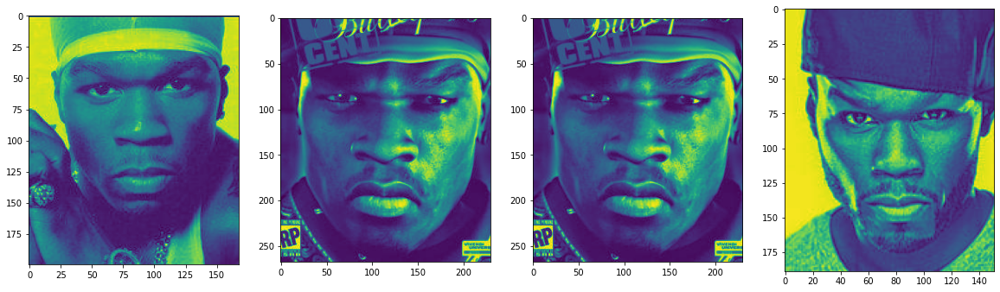

In [ ]:
import matplotlib.pyplot as plt

dataset = ImageDataset(PATH + 'train.csv', PATH + 'index.txt')

classes = dataset.classes
fig = plt.figure(figsize=(20,10))

image1, image2, label =dataset[0]
ax = plt.subplot(1, 4, 1)
plt.imshow(image2)
ax = plt.subplot(1, 4, 2)
plt.imshow(image1)

image1, image2, label =dataset[1]
ax = plt.subplot(1, 4, 3)
plt.imshow(image2)
ax = plt.subplot(1, 4, 4)
plt.imshow(image1)

plt.show()

In [ ]:
import torchvision
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
img_size = 32
transform = transforms.Compose(
    [transforms.Resize((img_size, img_size)),
     #transforms.RandomHorizontalFlip(p=0.5), # data augmentation by fliping 
     transforms.ToTensor(),    # range [0, 255]  -> [0.0,1.0] Convert a PIL Image or numpy.ndarray (H x W x C)  to tensor (C x H x W) 
     transforms.Normalize((0.5, ), (0.5, ))   # channel=（channel-mean）/std  -> [-1, 1]
     ])

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0))) #  (C x H x W) -> (H x W x C) 
    plt.show()


train_set = ImageDataset(PATH + 'train.csv', PATH + 'index.txt', transform=transform)
test_set = ImageDataset(PATH + 'test.csv', PATH + 'index.txt', transform=transform)
valid_set = ImageDataset(PATH + 'valid.csv', PATH + 'index.txt', transform=transform)

train_loader = DataLoader(train_set, batch_size=128, shuffle=True)
test_loader = DataLoader(test_set, batch_size=1, shuffle=False)
valid_loader = DataLoader(valid_set, batch_size=1, shuffle=True)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
    

        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1, stride=1)  
        self.norm1 = nn.BatchNorm2d(32) 

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3,padding=1, stride=1)
        self.norm2 = nn.BatchNorm2d(32) 

        self.MaxPool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1, stride=1)
        self.norm3 = nn.BatchNorm2d(64) 

        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=1)
        self.norm4 = nn.BatchNorm2d(128)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=1)
        self.norm5 = nn.BatchNorm2d(256)

        self.conv6 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1, stride=1)
        self.norm6 = nn.BatchNorm2d(512)
        self.AvgPool = nn.AvgPool2d(kernel_size=(16,16))

        self.drop = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1*1*512, 512)
        self.fc2 = nn.Linear(1*1*512, 1)
        self.sig = nn.Sigmoid()
    
    
    def forward(self, x1, x2):
        #  3, 32, 32
        # out_dim = in_dim - kernel_size + 1  
        x1 = F.relu(self.norm1(self.conv1(x1))) #6, 14, 14 
        x1 = F.relu(self.norm2(self.conv2(x1)))
        x1 = self.MaxPool(x1)
        x1 = F.relu(self.norm3(self.conv3(x1)))
        x1 = F.relu(self.norm4(self.conv4(x1)))
        x1 = F.relu(self.norm5(self.conv5(x1)))
        x1 = F.relu(self.norm6(self.conv6(x1)))
        x1 = self.AvgPool(x1)

        x2 = F.relu(self.norm1(self.conv1(x2))) #6, 14, 14 
        x2 = F.relu(self.norm2(self.conv2(x2)))
        x2 = self.MaxPool(x2)
        x2 = F.relu(self.norm3(self.conv3(x2)))
        x2 = F.relu(self.norm4(self.conv4(x2)))
        x2 = F.relu(self.norm5(self.conv5(x2)))
        x2 = F.relu(self.norm6(self.conv6(x2)))
        x2 = self.AvgPool(x2)

        x2 = x2.view(-1, 1*1*512)
        x1 = x1.view(-1, 1*1*512)

        h3 = self.aggregation(x1, x2)
        
        h3 = F.relu(self.fc1(h3))
        h3 = self.drop(h3)

        h3 = self.fc2(h3)
        h3 = self.sig(h3)
        return h3
    
    
    def aggregation(self, x1, x2):
      
      combined_x = abs(x1 - x2)
      
      return combined_x

    def merge(self, x1, x2):
      
      return x1.append(x2)

In [ ]:
#Q3 Counting the trainable parameter
def count_parameters(model):
  total_params = sum(para.numel() for para in model.parameters() if para.requires_grad)
  return total_params
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = Net().to(device)
print("The total learnable parameters :", count_parameters(net))

The total learnable parameters : 1842465


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
# the model that using merge, data return 1024*1

class Nett(nn.Module):
    def __init__(self):
        super(Nett, self).__init__()
    
        # (32x32x3)-> conv -> (28x28x6) -> pool -> (14x14x6) -> conv -> (10x10x16)->
        # pool -> (5x5x16) -> fc -> (120)-> fc -> (84) -> fc -> (10)
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1, stride=1)  
        self.norm1 = nn.BatchNorm2d(32) 

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3,padding=1, stride=1)
        self.norm2 = nn.BatchNorm2d(32) 

        self.MaxPool = nn.MaxPool2d(kernel_size=(2, 2))
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1, stride=1)
        self.norm3 = nn.BatchNorm2d(64) 

        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=1)
        self.norm4 = nn.BatchNorm2d(128)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=1)
        self.norm5 = nn.BatchNorm2d(256)

        self.conv6 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1, stride=1)
        self.norm6 = nn.BatchNorm2d(512)
        self.AvgPool = nn.AvgPool2d(kernel_size=(16,16))

        self.drop = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1*1*1024, 512)
        self.fc2 = nn.Linear(1*1*512, 1)
        self.sig = nn.Sigmoid()
    
    
    def forward(self, x1, x2):
        #  3, 32, 32
        # out_dim = in_dim - kernel_size + 1  
        x1 = F.relu(self.norm1(self.conv1(x1))) #6, 14, 14 
        x1 = F.relu(self.norm2(self.conv2(x1)))
        x1 = self.MaxPool(x1)
        x1 = F.relu(self.norm3(self.conv3(x1)))
        x1 = F.relu(self.norm4(self.conv4(x1)))
        x1 = F.relu(self.norm5(self.conv5(x1)))
        x1 = F.relu(self.norm6(self.conv6(x1)))
        x1 = self.AvgPool(x1)

        x2 = F.relu(self.norm1(self.conv1(x2))) #6, 14, 14 
        x2 = F.relu(self.norm2(self.conv2(x2)))
        x2 = self.MaxPool(x2)
        x2 = F.relu(self.norm3(self.conv3(x2)))
        x2 = F.relu(self.norm4(self.conv4(x2)))
        x2 = F.relu(self.norm5(self.conv5(x2)))
        x2 = F.relu(self.norm6(self.conv6(x2)))
        x2 = self.AvgPool(x2)

        x2 = x2.view(-1, 1*1*512)
        x1 = x1.view(-1, 1*1*512)

        # h3 = self.aggregation(x1, x2)
        h3 = merge(x1, x2)
        h3 = F.relu(self.fc1(h3))
        h3 = self.drop(h3)

        h3 = self.fc2(h3)
        h3 = self.sig(h3)
        print("The similarity score :",h3)
        return h3
    
    
    def aggregation(self, x1, x2):
      
      combined_x = abs(x1 - x2)
      
      return combined_x

    def merge(self, x1, x2):
      
      return x1.append(x2)

In [ ]:
nett = Nett().to(device)
print("Q4 The total learnable parameters after the replacement :", count_parameters(nett))

Q4 The total learnable parameters after the replacement : 2104609


In [ ]:
from tqdm.notebook import tqdm
from sklearn.metrics import classification_report

def eval(net,test_loader, optimal_value):
  best_acc = 0
  best_opt = 0
  with torch.no_grad():
      net.eval()
      for testing in optimal_value:
        correctness = 0
        for inputs1, inputs2, labels in test_loader:
          inputs1, inputs2, labels = inputs1.to(device), inputs2.to(device), labels.to(device)
          outputs = net(inputs1, inputs2)
          predicted, _= torch.max(outputs, 1)
          pred = predicted.cpu().detach().numpy()
          labels = labels.cpu().detach().numpy()
          if labels == 1 and pred > testing :
            correctness += 1
          if labels == 0 and pred <= testing :
            correctness += 1

        print("threshold : {} Accuracy: {}".format(testing, correctness/len(test_loader)))
        if correctness/len(test_loader) > best_acc:
          best_opt = testing
          best_acc = correctness/len(test_loader)
      print("The best accuracy :",best_acc," The best optimal value : ",best_opt)


def valid(net, valid_loader, criterion, device, valid_10):
    with torch.no_grad():
      net.eval()
      running_loss = 0.0
      running_corrects = 0
      for inputs1, inputs2, labels in tqdm(valid_loader):
                    
        inputs1 = inputs1.to(device)
        inputs2 = inputs2.to(device)
        labels = labels.to(device)

        outputs = net(inputs1, inputs2)
        labels = labels.unsqueeze(1)
        loss = criterion(outputs, labels)
        running_loss += loss.item()


    valid_loss = running_loss / len(valid_loader)
    valid_10.append(valid_loss)


def TRAIN(net, train_loader, valid_loader,  num_epochs, criterion, optimizer, val_loss, device, save_name, train_10, valid_10):
    
    if val_loss==None:
        best_val_loss = float("Inf")  
    else: 
        best_val_loss=val_loss
        print('Resume training')
    
    step_t = 0
    report_loss = 0
    validate_loss = 0
    
    for epoch in range(num_epochs):  # loop over the dataset multiple times
        running_loss = 0.0
        running_corrects = 0
        for inputs1, inputs2, labels in tqdm(train_loader):
            net.train()
            step_t+=1
            inputs1 = inputs1.to(device)
            inputs2 = inputs2.to(device)
            labels = labels.to(device)

            '''Training of the model'''
            # Forward pass
            outputs = net(inputs1, inputs2)
            labels = labels.unsqueeze(1)
            loss = criterion(outputs, labels)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
              
            running_loss += loss.item()
            report_loss += loss.item()

            if step_t % 10 == 0 :
              train_10.append(report_loss/10)
              report_loss = 0
              valid(net, valid_loader, criterion, device, valid_10)
        
        train_loss = running_loss / len(train_loader)

        print('Epoch [{}/{}], Train Loss: {:.4f}'
              .format(epoch+1, num_epochs, train_loss))
        
    print('Finished Training')


def load_model(model, path, optimizer, val_loss):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  load_mod = model
  load_mod = load_mod.to(device)
  parameter = torch.load(path)

  load_mod.load_state_dict(parameter['model'])
  optimizer.load_state_dict(parameter['optimizer'])
  val_loss = parameter['val_loss']
  return load_mod, optimizer, val_loss

  
def save_model(model, files, optimizer, val_loss):
  state_para = {'model':model.state_dict(),
                'optimizer':optimizer.state_dict(),
                'val_loss':val_loss
      
  }
  torch.save(state_para, files)

In [ ]:
#Q5 model training, and saving
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model = Net()
model = model.to(device)
num_epochs = 20
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
save_path = f'Q5model.pt'

train_report = []
validate_report = []
TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model, save_path,optimizer, validate_report)

cuda




Epoch [1/20], Train Loss: 0.6949




Epoch [2/20], Train Loss: 0.6608




Epoch [3/20], Train Loss: 0.6234




Epoch [4/20], Train Loss: 0.5772




Epoch [5/20], Train Loss: 0.5445




Epoch [6/20], Train Loss: 0.5138




Epoch [7/20], Train Loss: 0.4672




Epoch [8/20], Train Loss: 0.4472




Epoch [9/20], Train Loss: 0.4213




Epoch [10/20], Train Loss: 0.4043




Epoch [11/20], Train Loss: 0.3806




Epoch [12/20], Train Loss: 0.3574




Epoch [13/20], Train Loss: 0.3193




Epoch [14/20], Train Loss: 0.2964




Epoch [15/20], Train Loss: 0.2700




Epoch [16/20], Train Loss: 0.2417




Epoch [17/20], Train Loss: 0.2265




Epoch [18/20], Train Loss: 0.2007




Epoch [19/20], Train Loss: 0.1741




Epoch [20/20], Train Loss: 0.1620
Finished Training


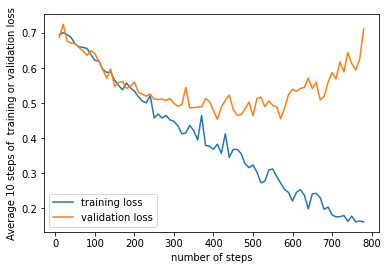

In [ ]:
#Q5 plot figure
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validate_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

In [ ]:
#Q6 find the optimal value:
Path = "gdrive/MyDrive/Q5model.pt"
model_8A_first = Net()
model_8A_first = model_8A_first.to(device)
optimizer = optim.Adam(model_8A_first.parameters(),lr=0.001)
validation_loss = []
model_8A_first, optimizer, validation_loss = load_model(Net(), Path , optimizer ,validation_loss)
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
eval(model_8A_first, valid_loader, optim_value)

threshold : 0.1 Accuracy: 0.77
threshold : 0.2 Accuracy: 0.7714285714285715
threshold : 0.3 Accuracy: 0.7714285714285715
threshold : 0.4 Accuracy: 0.7585714285714286
threshold : 0.5 Accuracy: 0.7585714285714286
threshold : 0.6 Accuracy: 0.7571428571428571
threshold : 0.7 Accuracy: 0.75
threshold : 0.8 Accuracy: 0.7414285714285714
threshold : 0.9 Accuracy: 0.7085714285714285
The best accuracy : 0.7714285714285715  The best optimal value :  0.2


# This is the experiment session :
##Running multiple time, which may be alittle bit massive. Sorry.

###Q8A, First trial
*   Class name Net()
*    Optimizer = Adagrd
*    lr=0.001
*   epochs = 15.


In [ ]:
#Q8 A changing Optimizer to Adagrad, lr = 0.001 , training and saving
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model_8A_first = Net()
model_8A_first = model_8A_first.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adagrad(model_8A_first.parameters(), lr=0.001)
save_path = f'model_8A_1.pt'

train_report = []
validate_report = []
TRAIN(model_8A_first, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8A_first,save_path,optimizer,validate_report)

cuda




Epoch [1/15], Train Loss: 0.6882




Epoch [2/15], Train Loss: 0.6654




Epoch [3/15], Train Loss: 0.6338




Epoch [4/15], Train Loss: 0.5900




Epoch [5/15], Train Loss: 0.5591




Epoch [6/15], Train Loss: 0.5352




Epoch [7/15], Train Loss: 0.5046




Epoch [8/15], Train Loss: 0.4839




Epoch [9/15], Train Loss: 0.4617




Epoch [10/15], Train Loss: 0.4316




Epoch [11/15], Train Loss: 0.4057




Epoch [12/15], Train Loss: 0.3868




Epoch [13/15], Train Loss: 0.3685




Epoch [14/15], Train Loss: 0.3371




Epoch [15/15], Train Loss: 0.3130
Finished Training


### Showing the  Acurracy result.

<font color='red'>This Model does not improve Q5 setting</font> 



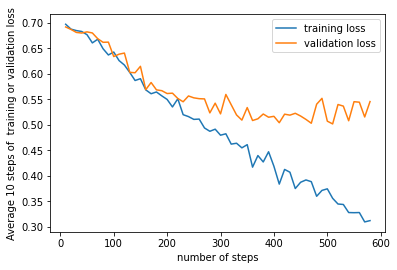

threshold : 0.1 Accuracy: 0.7271428571428571
threshold : 0.2 Accuracy: 0.7357142857142858
threshold : 0.3 Accuracy: 0.7457142857142857
threshold : 0.4 Accuracy: 0.7385714285714285
threshold : 0.5 Accuracy: 0.7328571428571429
threshold : 0.6 Accuracy: 0.7
threshold : 0.7 Accuracy: 0.67
threshold : 0.8 Accuracy: 0.6057142857142858
The best accuracy : 0.7457142857142857  The best optimal value :  0.3


In [ ]:
#8A first trial, testing the optimal value of threshold
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(train_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()
Path = "gdrive/MyDrive/model_8A_1.pt"
optimizer = optim.Adagrad(model_8A_first.parameters(), lr=0.001)
validation_loss = []
model_8A_first, optimizer, validation_loss = load_model(Net(), Path ,optimizer, validation_loss)
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
eval(model_8A_first, valid_loader, optim_value)


#Q8A model trial two 
* Optimizer to Adam
* lr = 0.0001
* epochs = 15
* other keep default


In [ ]:
#Q8 A changing Optimizer to Adagrad, lr = 0.0001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model_8A_third = Net()
model_8A_third = model_8A_third.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8A_third.parameters(), lr=0.0001)
save_path = f'model_8A_3.pt'

train_report = []
validate_report = []
TRAIN(model_8A_third, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8A_third,save_path,optimizer,validate_report)

cuda




Epoch [1/15], Train Loss: 0.6853




Epoch [2/15], Train Loss: 0.6749




Epoch [3/15], Train Loss: 0.6550




Epoch [4/15], Train Loss: 0.6166




Epoch [5/15], Train Loss: 0.5759




Epoch [6/15], Train Loss: 0.5504




Epoch [7/15], Train Loss: 0.5040




Epoch [8/15], Train Loss: 0.4711




Epoch [9/15], Train Loss: 0.4415




Epoch [10/15], Train Loss: 0.4117




Epoch [11/15], Train Loss: 0.3816




Epoch [12/15], Train Loss: 0.3425




Epoch [13/15], Train Loss: 0.2949




Epoch [14/15], Train Loss: 0.2773




Epoch [15/15], Train Loss: 0.2378
Finished Training


### The best Accuracy is 0.74 which is still worse than 0.77(Q5 model)
### this is the validation accuracy of the model above

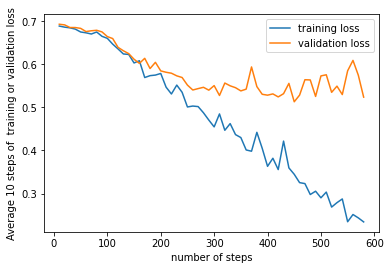

threshold : 0.1 Accuracy: 0.7242857142857143
threshold : 0.2 Accuracy: 0.7357142857142858
threshold : 0.3 Accuracy: 0.7328571428571429
threshold : 0.4 Accuracy: 0.7414285714285714
threshold : 0.5 Accuracy: 0.74
threshold : 0.6 Accuracy: 0.7185714285714285
threshold : 0.7 Accuracy: 0.6985714285714286
threshold : 0.8 Accuracy: 0.6528571428571428
The best accuracy : 0.7414285714285714  The best optimal value :  0.4


In [ ]:
#LOAD the trained model, and test its accuracy
#You may change the path dir
Path = "gdrive/MyDrive/model_8A_3.pt"
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validate_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()
validation_loss = []
optimizer = optim.Adam(model_8A_third.parameters(), lr=0.0001)
model_8A_third, optimizer, validation_loss = load_model(Net(), Path, optimizer, validation_loss)
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
eval(model_8A_third, valid_loader, optim_value)

# Q8A Training Using Same setting as Q5 with different epochs 

*   optimizer adam
*   lr = 0.001
*   epochs to 14
*   epochs to 12
*   epochs to 13
*   default


##Q8A Epochs = 14
* epochs = 14
* optimizer = adam
* lr = 0.001

In [ ]:
#Q8A Using same setting in Q5, change the epochs to 14, learning rate= 0.001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model_8A_4 = Net()
model_8A_4 = model_8A_4.to(device)
num_epochs = 14
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8A_4.parameters(), lr=0.001)
save_path = f'model_8A_o_14.pt'

train_report = []
validate_report = []
TRAIN(model_8A_4, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8A_4, save_path, optimizer, validate_report)

cuda




Epoch [1/14], Train Loss: 0.6822




Epoch [2/14], Train Loss: 0.6371




Epoch [3/14], Train Loss: 0.5881




Epoch [4/14], Train Loss: 0.5547




Epoch [5/14], Train Loss: 0.5297




Epoch [6/14], Train Loss: 0.4880




Epoch [7/14], Train Loss: 0.4573




Epoch [8/14], Train Loss: 0.4350




Epoch [9/14], Train Loss: 0.4086




Epoch [10/14], Train Loss: 0.3798




Epoch [11/14], Train Loss: 0.3483




Epoch [12/14], Train Loss: 0.3254




Epoch [13/14], Train Loss: 0.2950




Epoch [14/14], Train Loss: 0.2634
Finished Training


###better result: Validation accuracy 0.78> 0.77


threshold : 0.1 Accuracy: 0.7542857142857143
threshold : 0.2 Accuracy: 0.7771428571428571
threshold : 0.26455555 Accuracy: 0.7842857142857143
threshold : 0.3 Accuracy: 0.78
threshold : 0.4 Accuracy: 0.7814285714285715
threshold : 0.5 Accuracy: 0.7757142857142857
threshold : 0.6 Accuracy: 0.7557142857142857
threshold : 0.7 Accuracy: 0.7357142857142858
threshold : 0.8 Accuracy: 0.6785714285714286
threshold : 0.9 Accuracy: 0.6142857142857143
The best accuracy : 0.7842857142857143  The best optimal value :  0.26455555


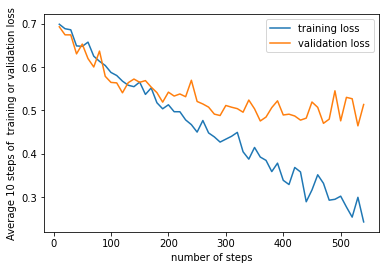

In [ ]:
#LOAD the trained model { above }, and test its accuracy
# 14 epochs, adam, defaut. 
#Please modify the path to the model file's dir + its name, following the format below
Path = "gdrive/MyDrive/model_8A_o_14.pt"
validation_loss = []
optimizer = optim.Adam(Net().parameters(), lr=0.001)
model_8A_4, optimizer, validation_loss = load_model(Net(), Path,optimizer, validation_loss)# may change according to your model's file name and dir.
optim_value = [0.1, 0.2, 0.26455555, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

eval(model_8A_4, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(train_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

## Q8A Epochs = 12


*   trial epochs = 12
*   optimizer = adam
*   lr = 0.001



In [ ]:
#Q8A Using same setting in Q5, change the epochs to 14, learning rate= 0.0001, not good.
#Q8A Using same setting in Q5, change the epochs to 14, learning rate= 0.001 0.8 better
#Q8A Using same setting in Q5, change the epochs to 14, learning rate= 0.001, weight_decay= 0.01 not good.
#Q8A Using epochs 12 not good
#Q8A Using epochs 13 best 
# Q8A ep 12 worse
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model_8A_5 = Net()
model_8A_5 = model_8A_5.to(device)
num_epochs = 12
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8A_5.parameters(), lr=0.001)
save_path = f'model_8A_5_12.pt'

train_report = []
validate_report = []
TRAIN(model_8A_5, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8A_5, save_path,optimizer,validate_report)

cuda




Epoch [1/12], Train Loss: 0.6915




Epoch [2/12], Train Loss: 0.6614




Epoch [3/12], Train Loss: 0.6370




Epoch [4/12], Train Loss: 0.6068




Epoch [5/12], Train Loss: 0.5818




Epoch [6/12], Train Loss: 0.5511




Epoch [7/12], Train Loss: 0.5348




Epoch [8/12], Train Loss: 0.5120




Epoch [9/12], Train Loss: 0.4709




Epoch [10/12], Train Loss: 0.4454




Epoch [11/12], Train Loss: 0.4186




Epoch [12/12], Train Loss: 0.3955
Finished Training


threshold : 0.1 Accuracy: 0.7457142857142857
threshold : 0.2 Accuracy: 0.7757142857142857
threshold : 0.3 Accuracy: 0.78
threshold : 0.4 Accuracy: 0.7628571428571429
threshold : 0.5 Accuracy: 0.7357142857142858
threshold : 0.6 Accuracy: 0.7071428571428572
threshold : 0.7 Accuracy: 0.6628571428571428
threshold : 0.8 Accuracy: 0.6071428571428571
threshold : 0.9 Accuracy: 0.52
threshold : 0.51 Accuracy: 0.73
threshold : 0.5105 Accuracy: 0.7314285714285714
threshold : 0.51111 Accuracy: 0.7314285714285714
threshold : 0.511111111 Accuracy: 0.7314285714285714
threshold : 0.51999999 Accuracy: 0.7314285714285714
threshold : 0.51815 Accuracy: 0.7328571428571429
The best accuracy : 0.78  The best optimal value :  0.3


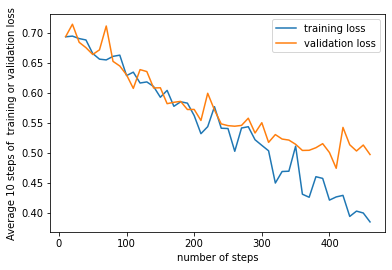

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8A_5_12.pt"
optimizer = optim.Adam(Net().parameters(), lr=0.001)
validation_loss = []
model_8A_5,optimizer,validation_loss= load_model(Net(), Path,optimizer,validation_loss)# may change according to your model's file name and dir.
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,0.51, 0.5105, 0.51111, 0.511111111, 0.51999999, 0.51815]
#0#.264555555
eval(model_8A_5, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(train_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()


#Q8D: Modify the layer. All the 8D classes are here

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


class test_Net(nn.Module):
    def __init__(self):
        super(test_Net, self).__init__()
    
        # (32x32x3)-> conv -> (28x28x6) -> pool -> (14x14x6) -> conv -> (10x10x16)->
        # pool -> (5x5x16) -> fc -> (120)-> fc -> (84) -> fc -> (10)
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1, stride=1)  
        self.norm1 = nn.BatchNorm2d(32) 

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3,padding=1, stride=1)
        self.norm2 = nn.BatchNorm2d(32) 
        
        self.conv_test = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=7,padding=1, stride=1)
        self.norm_test = nn.BatchNorm2d(32)

        self.MaxPool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1, stride=1)
        self.norm3 = nn.BatchNorm2d(64) 

        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=1)
        self.norm4 = nn.BatchNorm2d(128)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=1)
        self.norm5 = nn.BatchNorm2d(256)

        self.conv6 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1, stride=1)
        self.norm6 = nn.BatchNorm2d(512)
        self.AvgPool = nn.AvgPool2d(kernel_size=(14,14))

        self.drop = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1*1*512, 512)
        self.fc2 = nn.Linear(1*1*512, 1)
        self.sig = nn.Sigmoid()
    
    
    def forward(self, x1, x2):
        #  3, 32, 32
        # out_dim = in_dim - kernel_size + 1  
        x1 = F.relu(self.norm1(self.conv1(x1))) #6, 14, 14 
        x1 = F.relu(self.norm2(self.conv2(x1)))
        x1 = F.relu(self.norm_test(self.conv_test(x1)))
        x1 = self.MaxPool(x1)
        x1 = F.relu(self.norm3(self.conv3(x1)))
        x1 = F.relu(self.norm4(self.conv4(x1)))
        x1 = F.relu(self.norm5(self.conv5(x1)))
        x1 = F.relu(self.norm6(self.conv6(x1)))
        x1 = self.AvgPool(x1)

        x2 = F.relu(self.norm1(self.conv1(x2))) #6, 14, 14 
        x2 = F.relu(self.norm2(self.conv2(x2)))
        x2 = self.MaxPool(x2)
        x2 = F.relu(self.norm3(self.conv3(x2)))
        x2 = F.relu(self.norm4(self.conv4(x2)))
        x2 = F.relu(self.norm5(self.conv5(x2)))
        x2 = F.relu(self.norm6(self.conv6(x2)))
        x2 = self.AvgPool(x2)

        x2 = x2.view(-1, 1*1*512)
        x1 = x1.view(-1, 1*1*512)

        h3 = self.aggregation(x1, x2)
        
        h3 = F.relu(self.fc1(h3))
        h3 = self.drop(h3)

        h3 = self.fc2(h3)
        h3 = self.sig(h3)
        return h3
    
    
    def aggregation(self, x1, x2):
      
      combined_x = abs(x1 - x2)
      
      return combined_x

    def merge(self, x1, x2):
      
      return x1.append(x2)

In [ ]:

class VGG(nn.Module):

  def __init__(self):
    super(VGG, self).__init__()
    self.feature = self.create_layers()
    self.Linear1 = nn.Linear(512, 512)
    self.Linear2 = nn.Linear(512, 1)
    self.sig = nn.Sigmoid()
  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = self.Linear1(h3)
    h3 = self.Linear2(h3)
    h3 = self.sig(h3)
    return h3
  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)


class VGG_2(nn.Module):

  def __init__(self):
    super(VGG_2, self).__init__()
    self.feature = self.create_layers()
    self.Linear1 = nn.Linear(512, 512)
    self.Linear2 = nn.Linear(512, 256)
    self.Linear3 = nn.Linear(256, 1)
    self.sig = nn.Sigmoid()
  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = self.Linear1(h3)
    h3 = self.Linear2(h3)
    h3 = self.Linear3(h3)
    h3 = self.sig(h3)
    return h3
  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)


class VGG_3(nn.Module):

  def __init__(self):
    super(VGG_3, self).__init__()
    self.feature = self.create_layers()
    self.Linear1 = nn.Linear(512, 512)
    self.Linear2 = nn.Linear(512, 256)
    self.Linear3 = nn.Linear(256, 128)
    self.Linear4 = nn.Linear(128, 1)
    self.sig = nn.Sigmoid()
  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = self.Linear1(h3)
    h3 = self.Linear2(h3)
    h3 = self.Linear3(h3)
    h3 = self.Linear4(h3)
    h3 = self.sig(h3)
    return h3
  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)

# four fully connected layer with drop out
class VGG_4(nn.Module):

  def __init__(self):
    super(VGG_4, self).__init__()
    self.feature = self.create_layers()
    self.fc1 = nn.Linear(512, 512)
    self.fc2 = nn.Linear(512, 256)
    self.fc3 = nn.Linear(256, 128)
    self.fc4 = nn.Linear(128, 1)
    self.drop = nn.Dropout(0.5)
    self.sig = nn.Sigmoid()
  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = F.relu(self.fc1(h3))
    h3 = self.drop(h3)
    h3 = F.relu(self.fc2(h3))
    h3 = self.drop(h3)
    h3 = F.relu(self.fc3(h3))
    h3 = self.drop(h3)
    h3 = self.fc4(h3)
    h3 = self.sig(h3)
    return h3
  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)

class VGG_drop(nn.Module):

  def __init__(self):
    super(VGG_drop, self).__init__()
    self.feature = self.create_layers()
    self.Linear1 = nn.Linear(512, 512)
    self.drop = nn.Dropout(0.5)
    self.Linear2 = nn.Linear(512, 1)
    self.sig = nn.Sigmoid()

  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = F.relu(self.Linear1(h3))
    h3 = self.drop(h3)
    h3 = self.Linear2(h3)
    h3 = self.sig(h3)
    return h3

  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)

class VGG_drop02(nn.Module):

  def __init__(self):
    super(VGG_drop02, self).__init__()
    self.feature = self.create_layers()
    self.Linear1 = nn.Linear(512, 512)
    self.drop = nn.Dropout(0.5)
    self.Linear2 = nn.Linear(512, 256)
    self.Linear3 = nn.Linear(256, 1)
    self.sig = nn.Sigmoid()

  def forward(self, x1, x2):
    x1 = self.feature(x1)
    x2 = self.feature(x2)
    x1 = x1.view(x1.size(0),-1)
    x2 = x2.view(x2.size(0),-1)
    h3 = abs(x1 - x2)
    h3 = F.relu(self.Linear1(h3))
    h3 = self.drop(h3)
    h3 = F.relu(self.Linear2(h3))
    h3 = self.drop(h3)
    h3 = self.Linear3(h3)
    h3 = self.sig(h3)
    return h3
    
  def create_layers(self):
    layers = []
    input_channel = 1
    VGgg = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
    for x in VGgg:
      if x == 'M':
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
      else:
        layers += [nn.Conv2d(input_channel, x, kernel_size=3, padding=1),
                   nn.BatchNorm2d(x),
                   nn.ReLU(inplace=True)
                   ]
        input_channel = x
        
    layers += [nn.AvgPool2d(kernel_size=1, stride=1)]

    return nn.Sequential(*layers)

#Q8D - adding a conv layer      
* self.conv_test = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=7,padding=1, stride=1) -> new cov layer
* self.norm_test = nn.BatchNorm2d(32) -> new batch
* self.AvgPool = nn.AvgPool2d(kernel_size=(14,14)) -> change from 16->14

In [ ]:
#Q 8D - adding a conv layer before the MaxPooling_ using class name called test_net
# performance 0.73 validation accuracy with optimal threshold 0.3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model_8D_1 = test_Net()
model_8D_1 = model_8D_1.to(device)
num_epochs = 13
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8D_1.parameters(), lr=0.001)
save_path = f'model_8D_1.pt'

train_report = []
validate_report = []
TRAIN(model_8D_1, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8D_1, save_path)

cuda




Epoch [1/13], Train Loss: 0.6841




Epoch [2/13], Train Loss: 0.6479




Epoch [3/13], Train Loss: 0.6104




Epoch [4/13], Train Loss: 0.5617




Epoch [5/13], Train Loss: 0.5303




Epoch [6/13], Train Loss: 0.5176




Epoch [7/13], Train Loss: 0.4963




Epoch [8/13], Train Loss: 0.4659




Epoch [9/13], Train Loss: 0.4506




Epoch [10/13], Train Loss: 0.4129




Epoch [11/13], Train Loss: 0.4062




Epoch [12/13], Train Loss: 0.3824




Epoch [13/13], Train Loss: 0.3383
Finished Training


threshold : 0.1 Accuracy: 0.7228571428571429
threshold : 0.2 Accuracy: 0.7228571428571429
threshold : 0.3 Accuracy: 0.7357142857142858
threshold : 0.4 Accuracy: 0.7357142857142858
threshold : 0.5 Accuracy: 0.7342857142857143
threshold : 0.6 Accuracy: 0.7271428571428571
threshold : 0.7 Accuracy: 0.7128571428571429
threshold : 0.8 Accuracy: 0.6971428571428572
threshold : 0.9 Accuracy: 0.63
The best accuracy : 0.7357142857142858  The best optimal value :  0.3


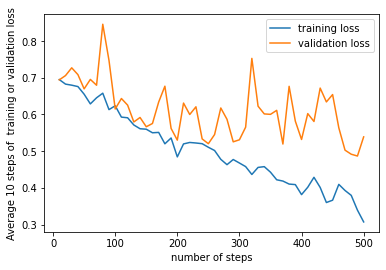

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8D_1.pt"
model_8D_1 = load_model(test_Net(), Path)# may change according to your model's file name and dir.
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
#0#.264555555
eval(model_8D_1, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(train_report)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

#Q8D VGG11 similar structure Model 1 
* class name VGG( ) -> define above
* epoch = 15
* optimizer = Adam
* default
* without dropout

In [ ]:
#Q 8D_2 - change the arch to VGG(), using 15 epochs
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_8D_2 = VGG()
model_8D_2 = model_8D_2.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8D_2.parameters(), lr=0.001)
save_path = f'model_8D_2.pt'

train_report = []
validate_report = []
TRAIN(model_8D_2, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8D_2, save_path,optimizer,validate_report)



Epoch [1/15], Train Loss: 0.7036




Epoch [2/15], Train Loss: 0.6460




Epoch [3/15], Train Loss: 0.5665




Epoch [4/15], Train Loss: 0.5288




Epoch [5/15], Train Loss: 0.5080




Epoch [6/15], Train Loss: 0.4860




Epoch [7/15], Train Loss: 0.4593




Epoch [8/15], Train Loss: 0.4135




Epoch [9/15], Train Loss: 0.4141




Epoch [10/15], Train Loss: 0.3482




Epoch [11/15], Train Loss: 0.3054




Epoch [12/15], Train Loss: 0.2624




Epoch [13/15], Train Loss: 0.2362




Epoch [14/15], Train Loss: 0.1836




Epoch [15/15], Train Loss: 0.1682
Finished Training


threshold : 0.1 Accuracy: 0.8028571428571428
threshold : 0.2 Accuracy: 0.8114285714285714
threshold : 0.3 Accuracy: 0.8185714285714286
threshold : 0.4 Accuracy: 0.8214285714285714
threshold : 0.5 Accuracy: 0.8185714285714286
threshold : 0.6 Accuracy: 0.8157142857142857
threshold : 0.7 Accuracy: 0.8
threshold : 0.8 Accuracy: 0.7728571428571429
threshold : 0.9 Accuracy: 0.7257142857142858
The best accuracy : 0.8214285714285714  The best optimal value :  0.4


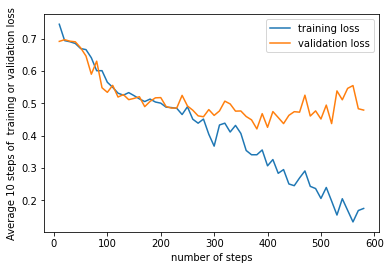

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8D_2.pt" # change it to the model dir and model file's name
optimizer = optim.Adam(VGG().parameters(), lr=0.001)
validation_loss = []
model_8D_2, optimizer, validation_loss = load_model(VGG(), Path,optimizer, validation_loss)
optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

eval(model_8D_2, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

#Q8D VGG11 similar structure Model 2
* class name VGG_2( ) -> define above
* epoch = 15
* optimizer = Adam
* default
* without dropout

In [ ]:
#Q 8D - using similar architecture as VGG 15 epoches: VGG_2, Using the 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_8D_4 = VGG_2()
model_8D_4 = model_8D_4.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8D_4.parameters(), lr=0.001)
save_path = f'model_8D_VGG2.pt'

train_report = []
validate_report = []
TRAIN(model_8D_4, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8D_4, save_path, optimizer, validate_report)



Epoch [1/15], Train Loss: 0.6798




Epoch [2/15], Train Loss: 0.5710




Epoch [3/15], Train Loss: 0.5126




Epoch [4/15], Train Loss: 0.5231




Epoch [5/15], Train Loss: 0.4769




Epoch [6/15], Train Loss: 0.4123




Epoch [7/15], Train Loss: 0.3735




Epoch [8/15], Train Loss: 0.3367




Epoch [9/15], Train Loss: 0.3074




Epoch [10/15], Train Loss: 0.2826




Epoch [11/15], Train Loss: 0.2202




Epoch [12/15], Train Loss: 0.2058




Epoch [13/15], Train Loss: 0.1648




Epoch [14/15], Train Loss: 0.1254




Epoch [15/15], Train Loss: 0.1487
Finished Training


threshold : 0.1 Accuracy: 0.7957142857142857
threshold : 0.11 Accuracy: 0.7942857142857143
threshold : 0.111 Accuracy: 0.7942857142857143
threshold : 0.12 Accuracy: 0.7957142857142857
threshold : 0.13 Accuracy: 0.7985714285714286
threshold : 0.14 Accuracy: 0.7985714285714286
threshold : 0.15 Accuracy: 0.7971428571428572
threshold : 0.2 Accuracy: 0.7971428571428572
threshold : 0.3 Accuracy: 0.7857142857142857
threshold : 0.4 Accuracy: 0.7742857142857142
threshold : 0.5 Accuracy: 0.7642857142857142
threshold : 0.6 Accuracy: 0.7471428571428571
threshold : 0.7 Accuracy: 0.74
threshold : 0.8 Accuracy: 0.7157142857142857
threshold : 0.9 Accuracy: 0.6985714285714286
threshold : 0.31 Accuracy: 0.78
threshold : 0.32 Accuracy: 0.7771428571428571
threshold : 0.33 Accuracy: 0.7771428571428571
threshold : 0.34 Accuracy: 0.7771428571428571
threshold : 0.35 Accuracy: 0.7771428571428571
threshold : 0.36 Accuracy: 0.7785714285714286
threshold : 0.37 Accuracy: 0.7742857142857142
threshold : 0.38 Accurac

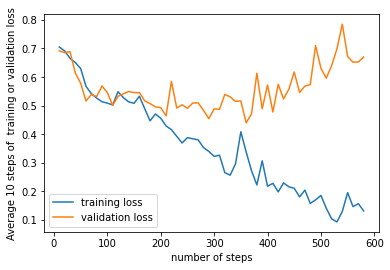

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8D_VGG2.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(model_8D_4.parameters(), lr=0.0201)
validation_loss = []
model_8D_4,optimizers,validation_loss = load_model(VGG_2(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.
optim_value = [0.1, 0.11, 0.111, 0.12, 0.13, 0.14, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38]
eval(model_8D_4, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

#Q8D VGG11 similar structure Model 3
* Class name VGG_3()
* optimizer = Adam
* lr = 0.001
* without dropout.

In [ ]:
#Q 8D - VGG_3 try first with the 15 epochs,
# second trial is 10 epochs 
# 15 epochs is kepty
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_8D_5 = VGG_3()
model_8D_5 = model_8D_5.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8D_5.parameters(), lr=0.001)
save_path = f'model_8D_VGG3_2.pt'

train_report = []
validate_report = []
TRAIN(model_8D_5, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8D_5, save_path, optimizer, validate_report)



Epoch [1/15], Train Loss: 0.6645




Epoch [2/15], Train Loss: 0.5366




Epoch [3/15], Train Loss: 0.4837




Epoch [4/15], Train Loss: 0.4367




Epoch [5/15], Train Loss: 0.4005




Epoch [6/15], Train Loss: 0.3569




Epoch [7/15], Train Loss: 0.3170




Epoch [8/15], Train Loss: 0.2880




Epoch [9/15], Train Loss: 0.2484




Epoch [10/15], Train Loss: 0.2383




Epoch [11/15], Train Loss: 0.1996




Epoch [12/15], Train Loss: 0.1703




Epoch [13/15], Train Loss: 0.1408




Epoch [14/15], Train Loss: 0.1235




Epoch [15/15], Train Loss: 0.1246
Finished Training


## SEE different epochs' performance using same setting.(VGG3() )
* epochs 15



Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)
threshold : 0.1 Accuracy: 0.7785714285714286
threshold : 0.2 Accuracy: 0.7685714285714286
threshold : 0.3 Accuracy: 0.7628571428571429
threshold : 0.5 Accuracy: 0.7485714285714286
threshold : 0.6 Accuracy: 0.7414285714285714
threshold : 0.7 Accuracy: 0.7342857142857143
threshold : 0.8 Accuracy: 0.7171428571428572
threshold : 0.9 Accuracy: 0.6928571428571428
threshold : 0.31 Accuracy: 0.7614285714285715
threshold : 0.32 Accuracy: 0.76
threshold : 0.33 Accuracy: 0.7628571428571429
threshold : 0.34 Accuracy: 0.7628571428571429
threshold : 0.35 Accuracy: 0.7628571428571429
threshold : 0.36 Accuracy: 0.7628571428571429
threshold : 0.37 Accuracy: 0.7585714285714286
threshold : 0.38 Accuracy: 0.7585714285714286
The best accuracy : 0.7785714285714286  The best optimal value :  0.1


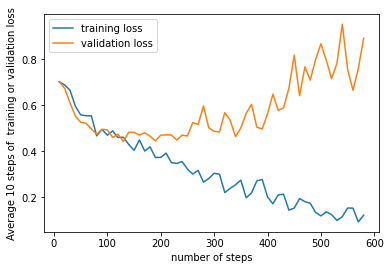

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8D_VGG3_2.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(model_8D_5.parameters(), lr=0.0201)
validation_loss = []
model_8D_5,optimizers,validation_loss = load_model(VGG_3(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.

optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38]

print(optimizers)
eval(model_8D_5, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()


* epochs 10

In [ ]:
#Q 8D - VGG_3 try first with the 15 epochs,
# second trial is 10 epochs 
# 15 epochs is kepty
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_8D = VGG_3()
model_8D = model_8D.to(device)
num_epochs = 10
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_8D.parameters(), lr=0.001)
save_path = f'model_8D_VGG3_10e.pt'

train_report = []
validate_report = []
TRAIN(model_8D, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_8D, save_path, optimizer, validate_report)



Epoch [1/10], Train Loss: 0.6852




Epoch [2/10], Train Loss: 0.5663




Epoch [3/10], Train Loss: 0.5216




Epoch [4/10], Train Loss: 0.4960




Epoch [5/10], Train Loss: 0.4606




Epoch [6/10], Train Loss: 0.4380




Epoch [7/10], Train Loss: 0.4170




Epoch [8/10], Train Loss: 0.3733




Epoch [9/10], Train Loss: 0.3339




Epoch [10/10], Train Loss: 0.2986
Finished Training


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)
threshold : 0.1 Accuracy: 0.7742857142857142
threshold : 0.2 Accuracy: 0.7942857142857143
threshold : 0.3 Accuracy: 0.7957142857142857
threshold : 0.4 Accuracy: 0.7842857142857143
threshold : 0.5 Accuracy: 0.7857142857142857
threshold : 0.6 Accuracy: 0.7714285714285715
threshold : 0.7 Accuracy: 0.7671428571428571
threshold : 0.8 Accuracy: 0.7671428571428571
threshold : 0.9 Accuracy: 0.7128571428571429
The best accuracy : 0.7957142857142857  The best optimal value :  0.3


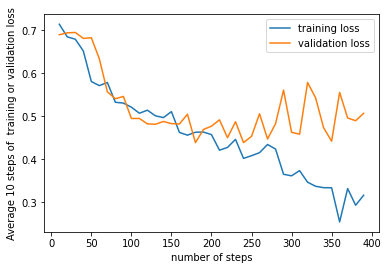

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_8D_VGG3_10e.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(model_8D_5.parameters(), lr=0.0201)
validation_loss = []
model_8D_5,optimizers,validation_loss = load_model(VGG_3(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.

optim_value = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

eval(model_8D_5, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

#Q8D VGG11 add dropout between fc layers Model 4-6
* add dropout between fully connected layer
* add relu function between connected layer

##Q8D This is Model 4, based on class VGG3 adds dropout to it.

* Class name : VGG_4()

In [ ]:
#Q 8D - using similar architecture as VGG 15 epoches: VGG_2, Using the 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_VG4 = VGG_4()
model_VG4 = model_VG4.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_VG4.parameters(), lr=0.001)
save_path = f'model_8D_VG4.pt'

train_report = []
validate_report = []
TRAIN(model_VG4, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_VG4, save_path, optimizer, validate_report)



Epoch [1/15], Train Loss: 0.6465




Epoch [2/15], Train Loss: 0.5777




Epoch [3/15], Train Loss: 0.5465




Epoch [4/15], Train Loss: 0.5224




Epoch [5/15], Train Loss: 0.4947




Epoch [6/15], Train Loss: 0.4450




Epoch [7/15], Train Loss: 0.4175




Epoch [8/15], Train Loss: 0.3673




Epoch [9/15], Train Loss: 0.3349




Epoch [10/15], Train Loss: 0.2858




Epoch [11/15], Train Loss: 0.2649




Epoch [12/15], Train Loss: 0.2296




Epoch [13/15], Train Loss: 0.1986




Epoch [14/15], Train Loss: 0.1840




Epoch [15/15], Train Loss: 0.1643
Finished Training


In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/gg.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(VGG_4().parameters(), lr=0.0201)
validation_loss = []
model_VG4,optimizers,validation_loss = load_model(VGG_4(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.
optim_value = [0.3,0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38,0.39]
eval(model_VG4, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

threshold : 0.3 Accuracy: 0.8028571428571428
threshold : 0.31 Accuracy: 0.8028571428571428
threshold : 0.32 Accuracy: 0.8014285714285714
threshold : 0.33 Accuracy: 0.8042857142857143
threshold : 0.34 Accuracy: 0.8042857142857143
threshold : 0.35 Accuracy: 0.8042857142857143
threshold : 0.36 Accuracy: 0.7985714285714286


##Q8D This is Model 5 , based on VGG() adds drop out betweeen fc to it.
* Class name : VGG_drop()

In [ ]:
#Q 8D - using similar architecture as VGG 15 epoches: VGG_2, Using the 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_VG_Drop = VGG_drop()
model_VG_Drop = model_VG_Drop.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_VG_Drop.parameters(), lr=0.001)
save_path = f'model_VG_Drop_01.pt'

train_report = []
validate_report = []
TRAIN(model_VG_Drop, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_VG_Drop, save_path, optimizer, validate_report)



Epoch [1/15], Train Loss: 0.6849




Epoch [2/15], Train Loss: 0.5955




Epoch [3/15], Train Loss: 0.5550




Epoch [4/15], Train Loss: 0.5271




Epoch [5/15], Train Loss: 0.5109




Epoch [6/15], Train Loss: 0.4745




Epoch [7/15], Train Loss: 0.4527




Epoch [8/15], Train Loss: 0.4166




Epoch [9/15], Train Loss: 0.3876




Epoch [10/15], Train Loss: 0.3579




Epoch [11/15], Train Loss: 0.3270




Epoch [12/15], Train Loss: 0.2929




Epoch [13/15], Train Loss: 0.2666




Epoch [14/15], Train Loss: 0.2381




Epoch [15/15], Train Loss: 0.2245
Finished Training


<bound method Module.state_dict of VGG_drop(
  (feature): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): Re

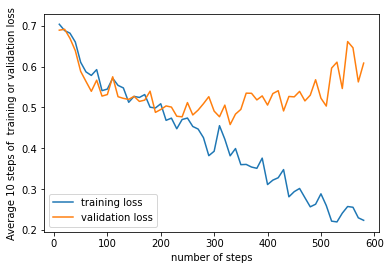

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_VG_Drop_01.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(VGG_drop().parameters(), lr=0.0201)

validation_loss = []
model_VG_Drop,optimizers,validation_loss = load_model(VGG_drop(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.
print(model_VG_Drop.state_dict)
optim_value = [0.2,0.201,0.22,0.21,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3,0.4]
eval(model_VG_Drop, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

##Q8D This is Mode 6, Adding drop out between fc1 fc2 in VGG_2()
* Class name : VGG_drop02

In [ ]:
#Q 8D - using similar architecture as VGG 15 epoches: VGG_2, Using the 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_VG_Drop2 = VGG_drop02()
model_VG_Drop2 = model_VG_Drop2.to(device)
num_epochs = 15
best_val_loss = None
criterion = nn.BCELoss()
optimizer = optim.Adam(model_VG_Drop2.parameters(), lr=0.001)
save_path = f'model_VG_Drop_02.pt'

train_report = []
validate_report = []
TRAIN(model_VG_Drop2, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_loss, device, save_path, train_report, validate_report)
save_model(model_VG_Drop2, save_path, optimizer, validate_report)



Epoch [1/15], Train Loss: 0.6761




Epoch [2/15], Train Loss: 0.5794




Epoch [3/15], Train Loss: 0.5427




Epoch [4/15], Train Loss: 0.4933




Epoch [5/15], Train Loss: 0.4514




Epoch [6/15], Train Loss: 0.4189




Epoch [7/15], Train Loss: 0.3676




Epoch [8/15], Train Loss: 0.3070




Epoch [9/15], Train Loss: 0.3142




Epoch [10/15], Train Loss: 0.2500




Epoch [11/15], Train Loss: 0.2061




Epoch [12/15], Train Loss: 0.2052




Epoch [13/15], Train Loss: 0.1698




Epoch [14/15], Train Loss: 0.1448




Epoch [15/15], Train Loss: 0.1388
Finished Training


<bound method Module.state_dict of VGG_drop02(
  (feature): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

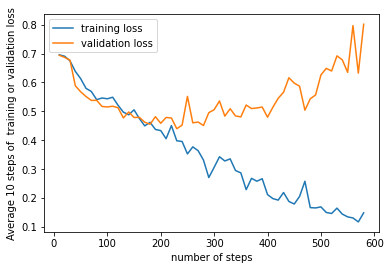

In [ ]:
#LOAD the trained model, and test its accuracy
Path = "gdrive/MyDrive/model_VG_Drop_02.pt" #or input the file dir and file name of the model.
optimizer =  optim.Adam(VGG_drop02().parameters(), lr=0.0201)
validation_loss = []
model_VG_Drop2,optimizers,validation_loss = load_model(VGG_drop02(), Path, optimizer, validation_loss)# may change according to your model's file name and dir.
print(model_VG_Drop2.state_dict)
optim_value = [0.2,0.201,0.22,0.21,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3,0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
eval(model_VG_Drop2, valid_loader, optim_value)
plt.plot(range(10, len(train_report)*10+10, 10), train_report,label="training loss")
plt.plot(range(10, len(validation_loss)*10+10, 10), validate_report,label="validation loss")
plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend()
plt.show()

#Q8 Model validation loss graph 

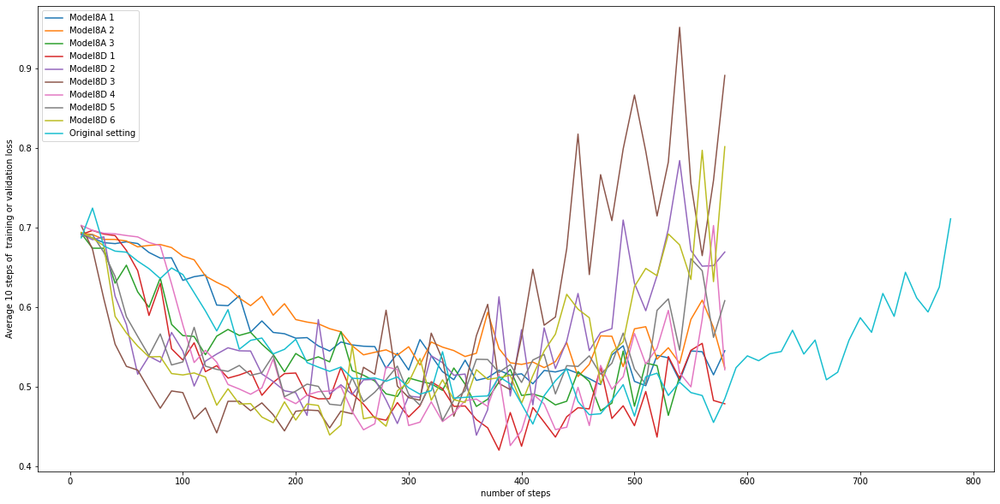

In [ ]:
ModelA1 = "gdrive/MyDrive/model_8A_1.pt"
ModelA2 = "gdrive/MyDrive/model_8A_3.pt"
ModelA3 = "gdrive/MyDrive/model_8A_o_14.pt"

ModelD1 = "gdrive/MyDrive/model_8D_2.pt"
ModelD2 = "gdrive/MyDrive/model_8D_VGG2.pt"
ModelD3 = "gdrive/MyDrive/model_8D_VGG3_2.pt"

ModelD4 = "gdrive/MyDrive/model_8D_VG4.pt"
ModelD5 = "gdrive/MyDrive/model_VG_Drop_01.pt"
ModelD6 = "gdrive/MyDrive/model_VG_Drop_02.pt"

original_path = "gdrive/MyDrive/Q5model.pt"
optimizer = optim.Adagrad(Net().parameters(), lr=0.001)
validation_loss = []
fig = plt.figure(figsize=(20, 10))
modelA1,optimizerA,validation_loss = load_model(Net(), ModelA1, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8A 1")

optimizer = optim.Adam(Net().parameters(), lr=0.0001)
modelA2,optimizerA,validation_loss = load_model(Net(), ModelA2, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8A 2")


optimizer = optim.Adam(Net().parameters(), lr=0.001)
modelA3,optimizerA,validation_loss = load_model(Net(), ModelA3, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8A 3")

optimizer = optim.Adam(VGG().parameters(), lr=0.001)
modelD1,optimizerA,validation_loss = load_model(VGG(), ModelD1, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 1")


optimizer = optim.Adam(VGG_2().parameters(), lr=0.001)
modelD2,optimizerA,validation_loss = load_model(VGG_2(), ModelD2, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 2")

optimizer = optim.Adam(VGG_3().parameters(), lr=0.001)
modelD3,optimizerA,validation_loss = load_model(VGG_3(), ModelD3, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 3")

optimizer = optim.Adam(VGG_4().parameters(), lr=0.001)
modelD4,optimizerA,validation_loss = load_model(VGG_4(), ModelD4, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 4")

optimizer = optim.Adam(VGG_drop().parameters(), lr=0.001)
modelD4,optimizerA,validation_loss = load_model(VGG_drop(), ModelD5, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 5")

optimizer = optim.Adam(VGG_drop02().parameters(), lr=0.001)
modelD4,optimizerA,validation_loss = load_model(VGG_drop02(), ModelD6, optimizer, validation_loss)# may change according to your model's file name and dir.
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Model8D 6")



model_8A_first = Net()
model_8A_first = model_8A_first.to(device)
optimizer = optim.Adam(model_8A_first.parameters(),lr=0.001)
validation_loss = []
model_8A_first, optimizer, validation_loss = load_model(Net(), original_path , optimizer ,validation_loss)
plt.plot(range(10, len(validation_loss)*10+10, 10), validation_loss,label="Original setting")

plt.ylabel("Average 10 steps of  training or validation loss")
plt.xlabel("number of steps")
plt.legend(loc='upper left')
plt.show()


# Q9 prediction making

In [ ]:

def pred_face(threshold, test_loader, test_file, net):

  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  idx = 0
  net.eval()
  for inputs1, inputs2, labels in test_loader:
    inputs1, inputs2, labels = inputs1.to(device), inputs2.to(device), labels.to(device)
    outputs = net(inputs1, inputs2)
    predicted, _= torch.max(outputs, 1)
    pred = predicted.cpu().detach().numpy()
    if pred > threshold :
      test_file.iloc[idx, -1] = 1
    if pred <= threshold :
      test_file.iloc[idx, -1] = 0
    idx += 1
  return test_file

### Model Used : 8D->Model 4 VGG_4()->15epoch->Adam->default
* threshold = 0.21


In [ ]:
import pandas as pd
Path = "gdrive/MyDrive/model_8D_VG4.pt" #or input the file dir and file name of the model.

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
optimizer =  optim.Adam(VGG_4().parameters(), lr=0.0201)
validation_loss = []

model_8D,optimizers,validation_loss = load_model(VGG_4(), Path, optimizer, validation_loss)
model_8D = model_8D.to(device)

optim_threshold = 0.21
test_file = pd.read_csv(PATH + "test.csv")
test_loader = DataLoader(test_set,batch_size=1, shuffle=False)
test_file = pred_face(optim_threshold, test_loader,test_file, net=model_8D)
test_file = test_file.astype(int)
test_file.to_csv('p1.csv', index=False)